# Import

In [35]:
import json
import itertools

import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import pandas as pd
import seaborn as sns

from matplotlib import rcParams
rcParams['figure.figsize'] = 8, 8

# Function declaration

In [36]:
def save_fig(fig, name):
    fig.savefig("./graphs/" + name + ".png", format="png")

In [37]:
def fix_status(df_line):
    if df_line.status != "UNKNOWN":
        return df_line.status

    if df_line.objectives != {}:
        return "SATISFIABLE"

    return df_line.status

In [38]:
def over_300(row):
    if row.solve_time > 300:
        row.solve_time = 300
        row.objectives = {k : v for k, v in row.objectives.items() if float(k) < 300}
        row.status = "Satisfiable" if len(row.objectives) > 1 else "Unknown"

    return row

In [39]:
def check(x : pd.DataFrame):
    try:
        model1 = x.iloc[0]
        model2 = x.iloc[1]

        status1 = model1.status
        status2 = model2.status

        obj1 = max(model1.objectives.values(), default=None)
        obj2 = max(model2.objectives.values(), default=None)
    except:
        return pd.DataFrame(x).assign(reason="NO CONFRONTATION")

    if status1 == "Optimal solution":
        if status2 == "Optimal solution":
            if obj1 != obj2:
                return x.assign(reason="BOTH SOLVERS SAY THEY REACHED OPTIMAL SOLUTION BUT THE VALUES ARE DIFFERENT")
        elif status2 == "Unsatisfiable":
            return x.assign(reason="ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT")
    elif status1 == "Unsatisfiable":
        if status2 == "Satisfiable" or status2 == "Optimal solution":
            return x.assign(reason="ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT")
    elif status1 == "Satisfiable":
        if status2 == "Unsatisfiable":
            return x.assign(reason="ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT")


In [40]:
def score(t1, t2):
    if t1 == 0 and t2 == 0:
        return (0.5, 0.5)
    else:
        return (
            t2 / (t1 + t2),
            t1 / (t1 + t2),
        )

def solved(x):
    if (
        x.status == "Optimal solution"
        or
        x.status == "Unsatisfiable"
        or
        x.status == "Satisfiable"
    ):
        return True

    return False

def optimal(x):
    return True if x.status == "Optimal solution" else False

def quality(x):
    return max(x.objectives.values(), default=None)

def better(x0, x1):
    q0 = quality(x0)
    q1 = quality(x0)
    if (
        (solved(x0) and not solved(x1))
        or
        (optimal(x0) and not optimal(x1))
        or
        ((q0 > q1) if q0 is not None and q1 is not None else False)
    ):
        return True

    return False

def borda_count(x):
    x0 = x.iloc[0]
    x1 = x.iloc[1]

    b0 = better(x0, x1)
    b1 = better(x1, x0)

    if b0 and not b1:
        return (1, 0)
    elif (b0 and b1) or (not b0 and not b1):
        return score(int(x0.solve_time), int(x1.solve_time))
    else:
        return (0, 1)

In [41]:
def import_df(path) -> pd.DataFrame:
    with open(path, "r") as f:
        results = json.load(f)

    dfs = []
    for k, v in results.items():
        x = pd.DataFrame(v).assign(**{
            "solver" : k
        })

        # Add test features
        test_feature = pd.DataFrame(
            x.problem.apply(lambda s : s.split("/")[-1][:-4].split("_")).tolist(),
            columns=["components", "flavours", "nodes", "resources", "comps_topology", "infra_topology", "test"]
        ).assign(**{
            "components" : lambda df : df.components.apply(lambda x : int(x[1:])),
            "flavours" : lambda df : df.flavours.apply(lambda x : int(x[1:])),
            "nodes" : lambda df : df.nodes.apply(lambda x : int(x[1:])),
            "resources" : lambda df : df.resources.apply(lambda x : int(x[1:])),
            "comps_topology" : lambda df : df.comps_topology.apply(lambda x : x[1:].upper()),
            "infra_topology" : lambda df : df.infra_topology.apply(lambda x : x[1:].upper()),
            "test" : lambda df : df.test.astype(int)
        })

        dfs.append(
            pd.merge(
                left=x,
                right=test_feature,
                right_index=True,
                left_index=True,
            ).drop(columns=["problem"])
        )

    return (
        pd.concat(dfs)
        .assign(**{
            # Corrections for unkown status codes
            "solve_time" : lambda df : df.apply(
                lambda x :
                    300
                    if "UNKNOWN" in x["status"]
                    else x.solve_time,
                axis=1),
            "status" : lambda df : df.apply(
                lambda x : fix_status(x),
                axis=1)
        }).replace({
            "cpsatlp": "OR-Tools",
            "gecode": "Gecode",
            "highs": "Highs",
            "chuffed": "Chuffed",
            "BARABASI": "small-world",
            "ERDOS": "random",
            "LADDER": "ladder",
            "WHEEL": "wheel",
            "PATH": "pipeline",
            "COMPLETE": "complete",
            "OPTIMAL_SOLUTION": "Optimal solution",
            "UNSATISFIABLE": "Unsatisfiable",
            "UNKNOWN": "Unknown",
            "SATISFIABLE": "Satisfiable"
        })
        .apply(over_300, axis=1)
        .assign(optimal_solution=lambda df : df.apply(
            lambda x : max(x.objectives.values()) if "Optimal solution" in x.status else None, axis=1
        ))
        .reset_index(drop=True)
    )


# Dataframe Import

In [42]:
component_topologies = ['small-world', 'random', 'pipeline']
infrastructure_topologies = ['small-world', 'random', 'complete', 'ladder', 'wheel']
solvers = ['Highs', 'Chuffed', 'Gecode', 'OR-Tools']

In [44]:
combinations = set(itertools.product(
    range(4, 40 + 1), #components
    range(4, 40 + 1), #nodes
    component_topologies,
    infrastructure_topologies,
    range(0, 3), #tests
    solvers
))
len(combinations)

246420

In [45]:
color = {
    "Chuffed" : "red",
    "OR-Tools": "orange",
    "Gecode" : "#1f77b4",
    "Highs" : "green"
}

marker = {
    "Chuffed" : ".",
    "OR-Tools": "+",
    "Gecode" : "x",
    "Highs" : "2"
}

In [46]:
df = import_df("./results/3-results-32x32-every-4.json")
df

FileNotFoundError: [Errno 2] No such file or directory: './results/3-results-32x32-every-4.json'

In [37]:
indexes = set(df.set_index(["components", "nodes", "comps_topology", "infra_topology", "test", "solver"]).index)

missing = pd.DataFrame(
    data=combinations - indexes,
    columns=["components", "nodes", "comps_topology", "infra_topology", "test", "solver"]
)
missing

,components,nodes,comps_topology,infra_topology,test,solver


# Clean Up

In [38]:
errors = []

for solver1, solver2 in itertools.combinations(solvers, r=2):
    to_group = df.query("solver == @solver1 or solver == @solver2")
    for _, group in to_group.groupby(["components", "nodes", "comps_topology", "infra_topology", "test"]):
        a = check(group)
        if a is not None:
            errors.append(a)

In [39]:
indexes_error = []

In [40]:
error_statuses_discordant = (
    pd.concat(errors)
    .drop(columns=["objectives"])
    .drop_duplicates()
    .query("reason == 'ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT'")
    .groupby(["components", "nodes", "comps_topology", "infra_topology", "test"])
)

for _, g in error_statuses_discordant:
    objs = g.optimal_solution.value_counts().sort_values(ascending=False).to_dict()

    if len(g.query("solver == 'Highs'")) == 0:
        print("OTHER ERRORS EXCEPT FOR HIGHS OCCURED")

    indexes_error += g.query("solver == 'Highs'").index.values.tolist()

In [41]:
# # Try to understand (by an election) the istances where ONE SOLVER SAY UNSAT BUT THE OTHER ONE SAID SAT/OPTIMAL
# error_statuses_discordant = (
#     pd.concat(errors)
#     .drop(columns=["objectives"])
#     .drop_duplicates()
#     .query("reason == 'ONE SOLVER SAY UNSAT BUT THE OTHER ONE SAY SAT/OPTIMAL'")
#     .groupby(["components", "nodes", "comps_topology", "infra_topology", "test"])
# )

# status_discordant = {s : 0 for s in solvers}

# for _, g in error_statuses_discordant:
#     statuses = g.status.value_counts().sort_values(ascending=False).to_dict()

#     # Check if there is a status elector
#     if all(v == int(sum(statuses.values()) / len(statuses)) for v in statuses.values()):
#         print("Cannot make an election for status results")
#         print(g)
#         print()
#         continue

#     status_winner_class = max(statuses, key=statuses.get)
#     if status_winner_class == "Unsatisfiable":
#         status_winner_class = "UNSAT"
#     else:
#         status_winner_class = "OK"

#     for _, e in g.iterrows():
#         s = "UNSAT" if e.status == "Unsatisfiable" else "OK"
#         if s != status_winner_class:
#             status_discordant[e.solver] += 1


In [42]:
error_optimal_obj_discordant = (
    pd.concat(errors)
    .drop(columns=["objectives"])
    .drop_duplicates()
    .query("reason == 'BOTH SOLVERS SAY THEY REACHED OPTIMAL SOLUTION BUT THE VALUES ARE DIFFERENT'")
    .groupby(["components", "nodes", "comps_topology", "infra_topology", "test"])
)

for _, g in error_optimal_obj_discordant:
    objs = g.optimal_solution.value_counts().sort_values(ascending=False).to_dict()

    if len(g.query("solver == 'Highs'")) == 0:
        print("OTHER ERRORS EXCEPT FOR HIGHS OCCURED")
        print(g)

    indexes_error += g.query("solver == 'Highs'").index.values.tolist()

In [43]:
len(indexes_error)

2

In [44]:
for i in indexes_error:
    e = df[df.index == i]
    if e.solver.iloc[0] != "Highs":
        print("ERROR NOT ALWAYS HIGHS")
        print(e)

    df.at[i, "status"] = "Error"
    df.at[i, "solve_time"] = 300

In [45]:
df = df.reset_index(drop=True)

In [47]:
pd.concat(errors)

,status,flat_time,solve_time,objectives,solver,components,flavours,nodes,resources,comps_topology,infra_topology,test,optimal_solution,reason
5857,Satisfiable,0.865,300.000,"{'0.902': 22, '0.93': 23, '0.992': 24}",Chuffed,16,3,4,5,small-world,ladder,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
10357,Unsatisfiable,0.812,0.921,{},Highs,16,3,4,5,small-world,ladder,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
8686,Satisfiable,2.331,300.000,{'2.462': 48},Chuffed,40,3,16,5,small-world,complete,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
13186,Unsatisfiable,2.376,2.683,{},Highs,40,3,16,5,small-world,complete,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
10357,Unsatisfiable,0.812,0.921,{},Highs,16,3,4,5,small-world,ladder,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
14857,Satisfiable,1.344,300.000,"{'1.398': 21, '1.423': 22, '108.111': 23, '109...",Gecode,16,3,4,5,small-world,ladder,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
13186,Unsatisfiable,2.376,2.683,{},Highs,40,3,16,5,small-world,complete,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
17686,Satisfiable,2.453,300.000,"{'2.587': 45, '2.657': 47}",Gecode,40,3,16,5,small-world,complete,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
1357,Optimal solution,0.628,0.763,"{'0.714': 21, '0.741': 22, '0.749': 23, '0.756...",OR-Tools,16,3,4,5,small-world,ladder,1,24.0,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT
10357,Unsatisfiable,0.812,0.921,{},Highs,16,3,4,5,small-world,ladder,1,NaN,ONE SOLVER SAY SAT BUT THE OTHER ONE SAY UNSAT


# DataFrame Analysis

In [12]:
df.status.unique()

array(['Optimal solution', 'Unsatisfiable', 'Satisfiable', 'Unknown'],
      dtype=object)

In [13]:
df.status.value_counts()

status
Optimal solution    10859
Satisfiable          6797
Unsatisfiable          29
Unknown                 1
Name: count, dtype: int64

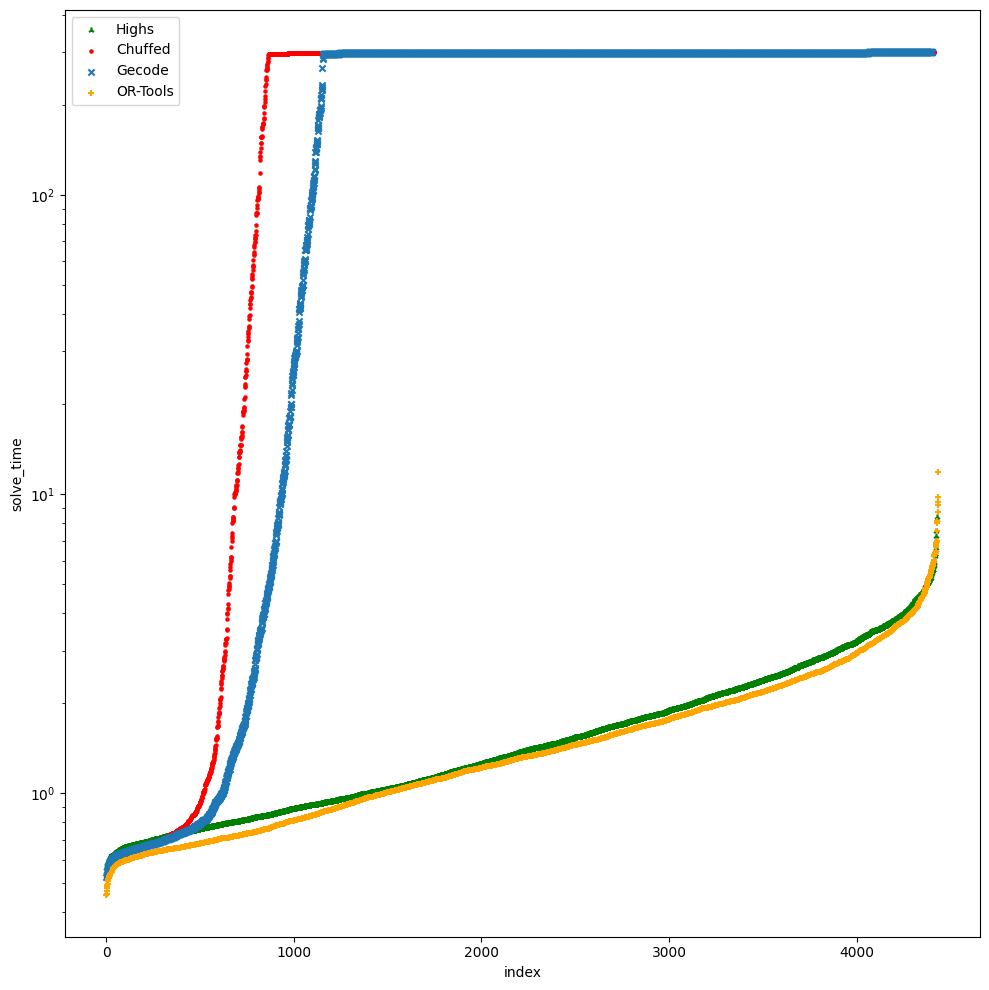

In [14]:
fig, ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(10, 10),
)

for solver in solvers:
    d = df.query("solver == @solver").solve_time.sort_values(ascending=True).reset_index(drop=True).reset_index()
    d.plot.scatter(x="index", y="solve_time", ax=ax, c=color[solver], marker=marker[solver], label=solver)

ax.legend()
ax.set_yscale("log")
fig.tight_layout()

# Solve Time

### Components

<Axes: xlabel='components', ylabel='solve_time'>

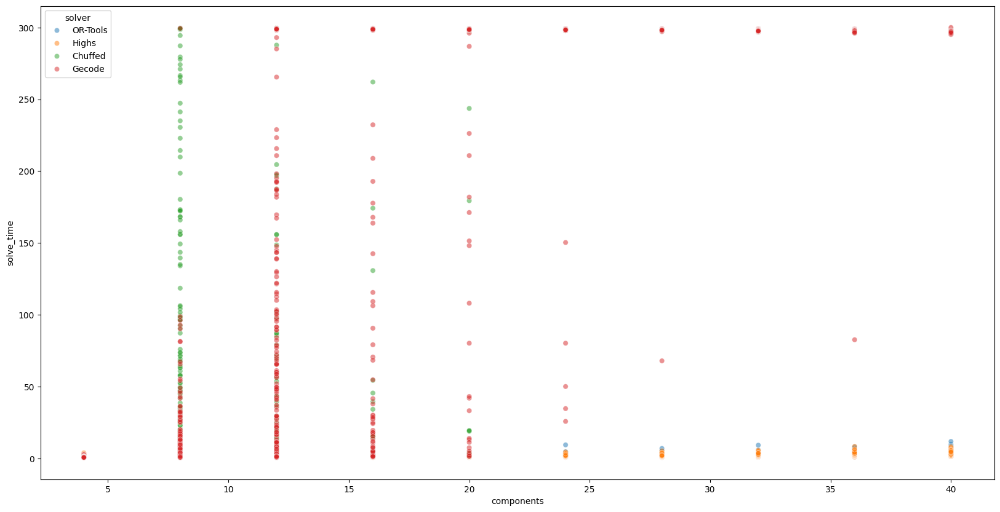

In [15]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=df, x="components", y="solve_time", alpha=0.5, hue="solver")

### Nodes

<Axes: xlabel='nodes', ylabel='solve_time'>

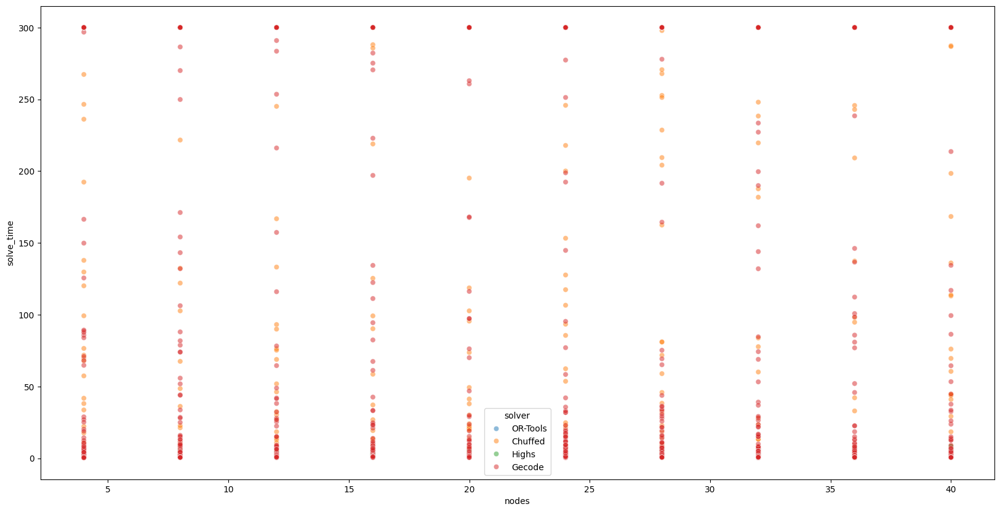

In [52]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=df, x="nodes", y="solve_time", alpha=0.5, hue="solver")

### Components x nodes

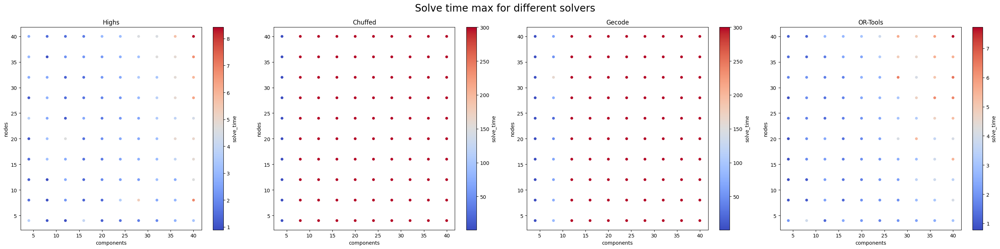

In [53]:
fig, axs = plt.subplots(
    nrows=1,
    ncols=len(solvers),
    figsize=(7 * len(solvers), 7)
)
axs_reshaped = axs.reshape(-1)
for solver, ax in zip(solvers, axs_reshaped):
    d = (
        df.query("solver == @solver")
        .query("status != 'Error'")
        #.assign(solve_time=np.log(df.solve_time))
        [["components", "nodes", "solve_time"]]
        .groupby(["components", "nodes"])
        #.mean()
        .max()
        .reset_index()
    )
    
    d.plot.scatter(
        x="components",
        y="nodes",
        c="solve_time",
        cmap="coolwarm",
        ax=ax
    )
    # ax.scatter(
    #     x=d.components,
    #     y=d.nodes,
    #     c=d.solve_time,
    #     cmap="coolwarm",
    #     #alpha=1.0/len(d.test.unique())
    # )
    # ax.set_xlabel("components")
    # ax.set_ylabel("nodes")
    ax.set_title(solver)

    #norm = Normalize(vmin=0, vmax=df.solve_time.max())
    #fig.colorbar(ScalarMappable(norm=norm, cmap="coolwarm"), ax=ax, orientation='vertical')

fig.suptitle("Solve time max for different solvers", fontsize=20)
fig.tight_layout()

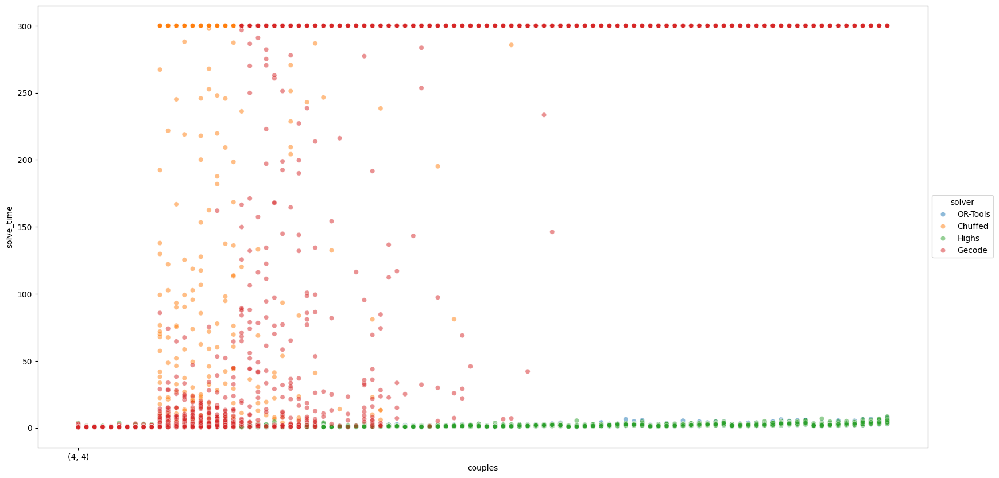

In [54]:
pair_df = df.sort_values(["components", "nodes"]).assign(**{
    "couples" : lambda df : df.apply(lambda x : (x["components"], x["nodes"]), axis=1)
})[["solver", "test", "couples", "solve_time"]]
pair_df["idx"] = pair_df.groupby("couples").ngroup()

show_every = 500
single_pairs = pair_df["couples"].drop_duplicates()
ticks = range(0, len(single_pairs.to_list()), show_every)
labels = single_pairs.apply(lambda x : str(x)).to_list()
labels = [labels[i] for i in ticks]

plt.figure(figsize=(20, 10))
p = sns.scatterplot(pair_df, x="idx", y="solve_time", alpha=0.5, hue="solver")
p.set_xticks(ticks)
p.set_xticklabels(labels)
p.set_xlabel("couples")
p.legend(title="solver", loc='center left', bbox_to_anchor=(1, 0.5))

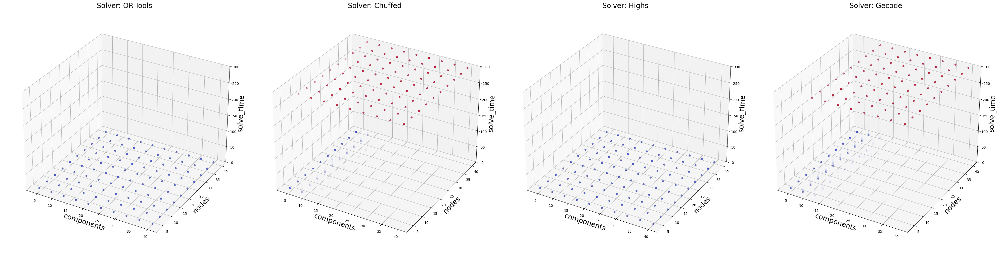

In [55]:
fig, axs = plt.subplots(
    nrows=1,
    ncols=len(solvers),
    figsize=(10 * len(solvers), 10),
    subplot_kw=dict(projection='3d')
)
axs_reshaped = axs.reshape(-1)
norm = Normalize(vmin=0, vmax=300)
for solver, ax in zip(df.solver.unique(), axs_reshaped):
    d = df.query("solver == @solver")
    ax.scatter(
        xs=d.components,
        ys=d.nodes,
        zs=d.solve_time,
        c=d.solve_time,
        cmap="coolwarm",
        norm=norm,
        alpha=1.0/(len(component_topologies) * len(infrastructure_topologies) * 3)
    )
    ax.set_xlabel("components", fontsize=20)
    ax.set_ylabel("nodes", fontsize=20)
    ax.set_zlabel("solve_time", fontsize=20)
    ax.set_title("Solver: " + solver, fontsize=20)
    ax.set_zlim([0, 300])
    ax.set_box_aspect(None, zoom=0.95)

fig.tight_layout()

### Topologies

Text(0.5, 0.98, 'Solve time for different solvers and components topology')

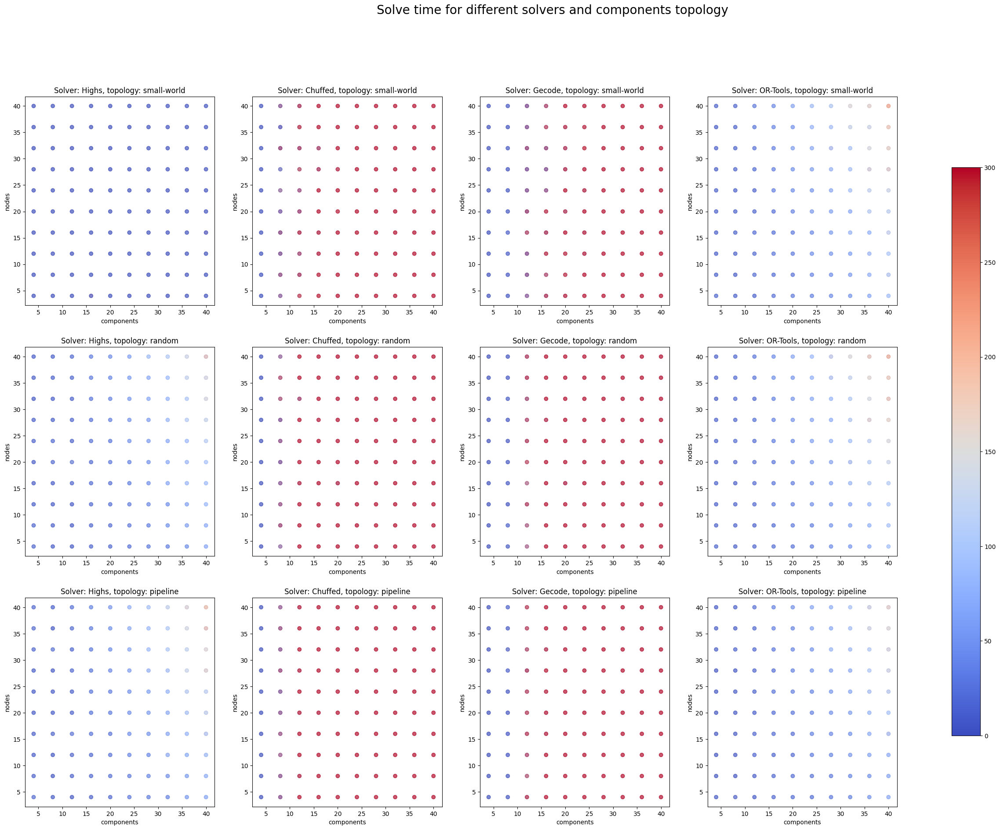

In [57]:
fig, axs = plt.subplots(
    nrows=len(component_topologies),
    ncols=len(solvers),
    figsize=(8 * len(solvers), 7 * len(component_topologies))
)
axs_reshaped = axs.reshape(-1)
axis = itertools.product(component_topologies, solvers)
for (topology, solver), ax in zip(axis, axs_reshaped):
    d = df.query("solver == @solver").query("comps_topology == @topology")
    ax.scatter(
        x=d.components,
        y=d.nodes,
        c=d.solve_time,
        cmap="coolwarm",
        alpha=1.0/(len(infrastructure_topologies) * 3)
    )
    ax.set_xlabel("components")
    ax.set_ylabel("nodes")
    ax.set_title("Solver: " + solver + ", topology: " + topology)

norm = Normalize(vmin=0, vmax=df.solve_time.max())
fig.colorbar(
    ScalarMappable(norm=norm, cmap="coolwarm"),
    ax=axs.ravel().tolist(),
    orientation='vertical',
    shrink=0.8
)
fig.suptitle("Solve time for different solvers and components topology", fontsize=20)

Text(0.5, 0.98, 'Solve time for different solvers and infrastructure topology')

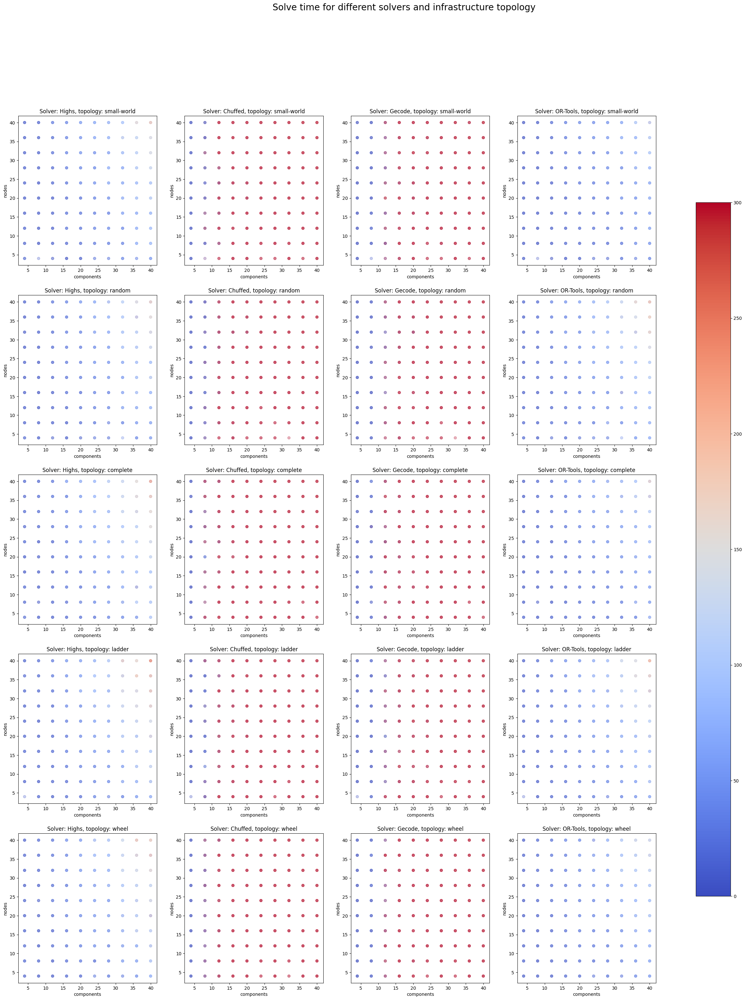

In [16]:
fig, axs = plt.subplots(
    nrows=len(infrastructure_topologies),
    ncols=len(solvers),
    figsize=(8 * len(solvers), 7 * len(infrastructure_topologies))
)
axs_reshaped = axs.reshape(-1)
axis = itertools.product(infrastructure_topologies, solvers)
for (topology, solver), ax in zip(axis, axs_reshaped):
    d = df.query("solver == @solver").query("infra_topology == @topology")
    ax.scatter(
        x=d.components,
        y=d.nodes,
        c=d.solve_time,
        cmap="coolwarm",
        alpha=1.0/(len(component_topologies) * 3)
    )
    ax.set_xlabel("components")
    ax.set_ylabel("nodes")
    ax.set_title("Solver: " + solver + ", topology: " + topology)

norm = Normalize(vmin=0, vmax=df.solve_time.max())
fig.colorbar(
    ScalarMappable(norm=norm, cmap="coolwarm"),
    ax=axs.ravel().tolist(),
    orientation='vertical',
    shrink=0.8
)
fig.suptitle("Solve time for different solvers and infrastructure topology", fontsize=20)

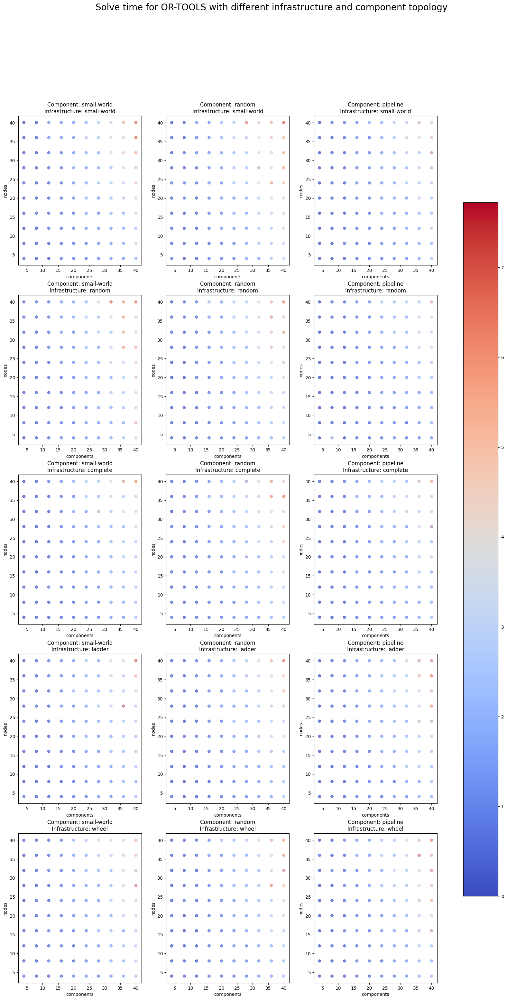

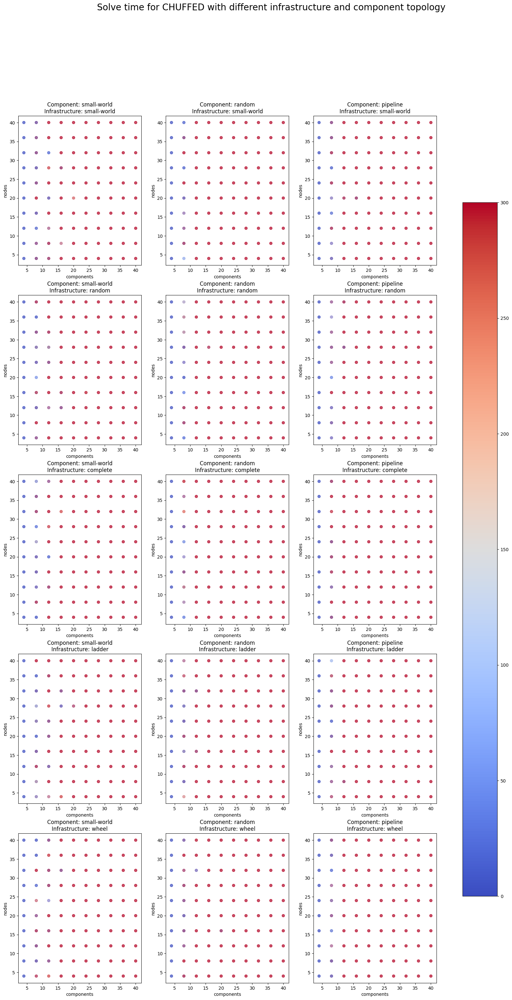

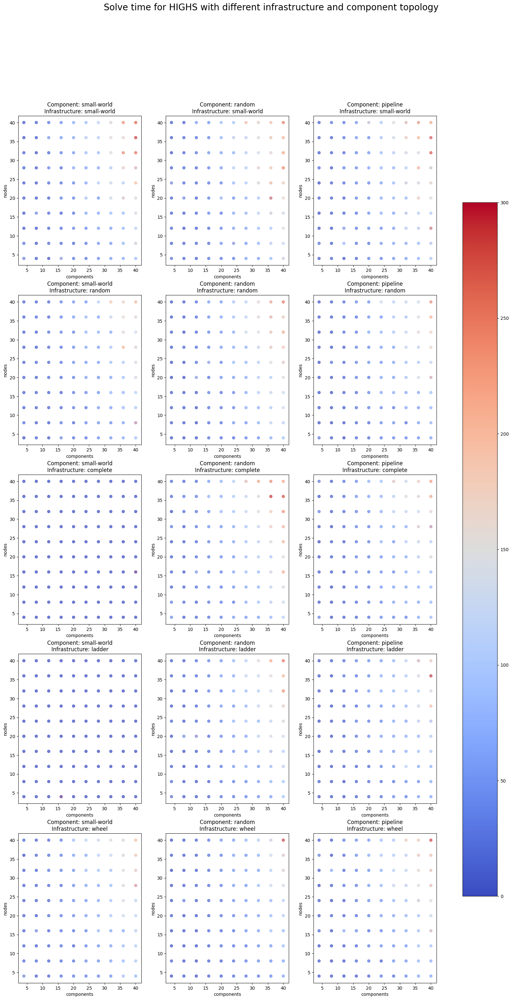

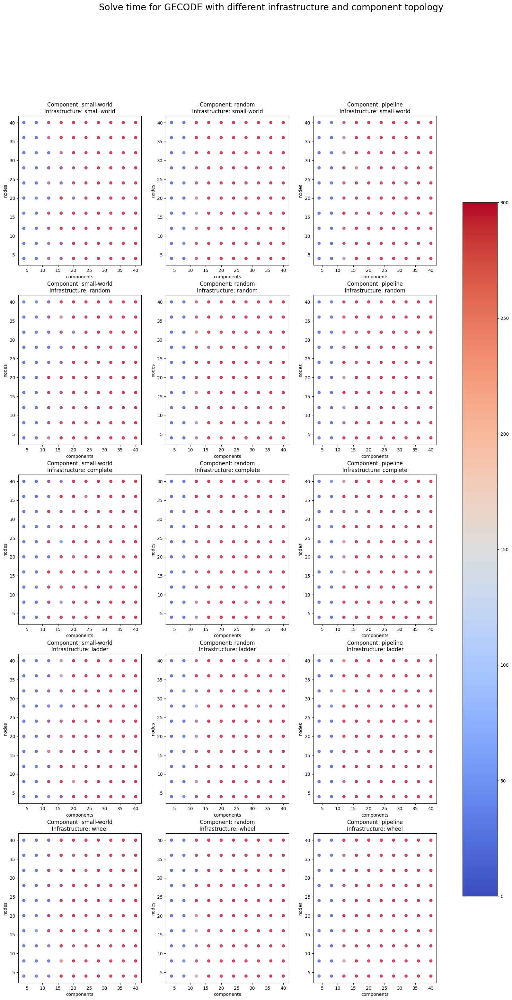

In [59]:
for solver in df.solver.unique():
    fig, axs = plt.subplots(
        nrows=len(infrastructure_topologies),
        ncols=len(component_topologies),
        figsize=(7 * len(component_topologies), 7 * len(infrastructure_topologies))
    )
    axs_reshaped = axs.reshape(-1)
    axis = itertools.product(infrastructure_topologies, component_topologies)
    df_solver = df.query("solver == @solver")
    for (infra_topology, comps_topology), ax in zip(axis, axs_reshaped):
        d = (
            df_solver
            .query("infra_topology == @infra_topology")
            .query("comps_topology == @comps_topology")
        )
        ax.scatter(
            x=d.components,
            y=d.nodes,
            c=d.solve_time,
            cmap="coolwarm",
            alpha=1.0/3
        )
        ax.set_xlabel("components")
        ax.set_ylabel("nodes")
        ax.set_title("Component: " + comps_topology + "\nInfrastructure: " + infra_topology)

    norm = Normalize(vmin=0, vmax=df_solver.solve_time.max())
    fig.colorbar(
        ScalarMappable(norm=norm, cmap="coolwarm"),
        ax=axs.ravel().tolist(),
        orientation='vertical',
        shrink=0.8
    )
    fig.suptitle("Solve time for " + solver.upper() + " with different infrastructure and component topology", fontsize=20)

# Flat time

### Components

<Axes: xlabel='components', ylabel='flat_time'>

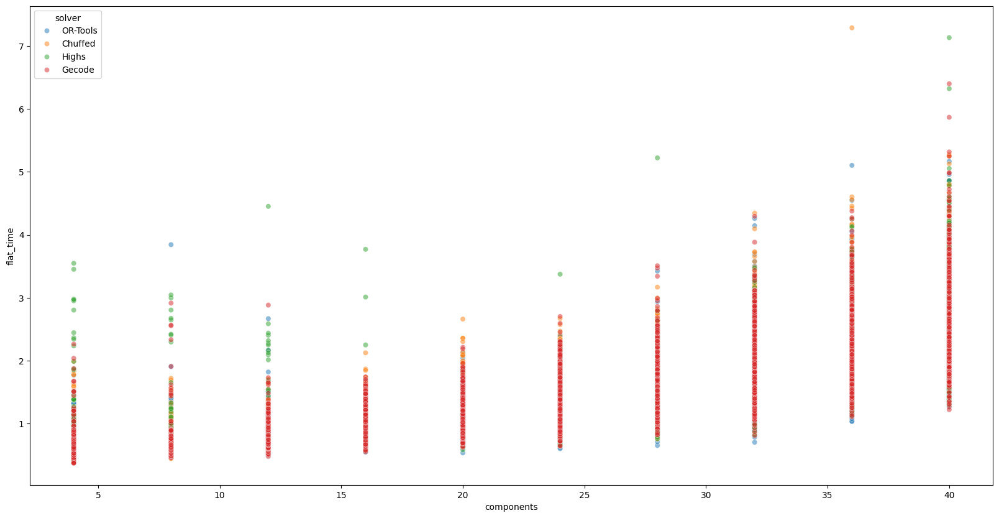

In [60]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=df, x="components", y="flat_time", alpha=0.5, hue="solver")

### Nodes

<Axes: xlabel='nodes', ylabel='flat_time'>

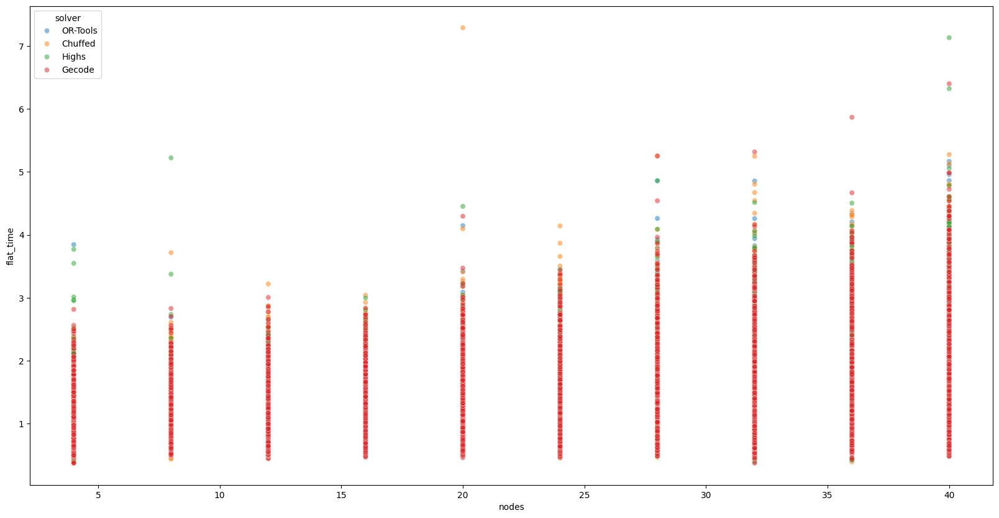

In [61]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=df, x="nodes", y="flat_time", alpha=0.5, hue="solver")

### Components x nodes

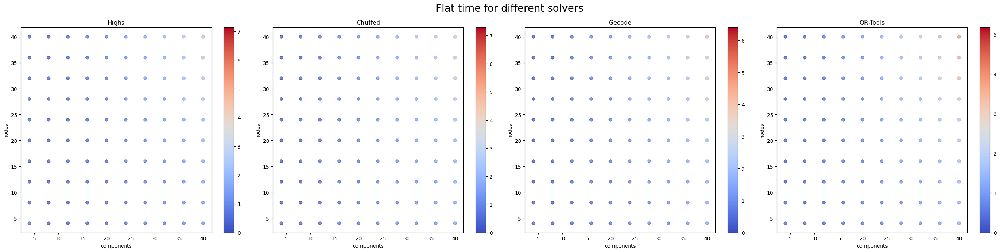

In [62]:
fig, axs = plt.subplots(
    nrows=1,
    ncols=len(solvers),
    figsize=(7 * len(solvers), 7)
)
axs_reshaped = axs.reshape(-1)
for solver, ax in zip(solvers, axs_reshaped):
    d = df.query("solver == @solver")
    norm = Normalize(vmin=0, vmax=d.flat_time.max())
    ax.scatter(
        x=d.components,
        y=d.nodes,
        c=d.flat_time,
        cmap="coolwarm",
        alpha=1.0/(len(component_topologies) * len(infrastructure_topologies) * 3)
    )
    ax.set_xlabel("components")
    ax.set_ylabel("nodes")
    ax.set_title(solver)
    fig.colorbar(ScalarMappable(norm=norm, cmap="coolwarm"), ax=ax, orientation='vertical')

fig.suptitle("Flat time for different solvers", fontsize=20)
fig.tight_layout()

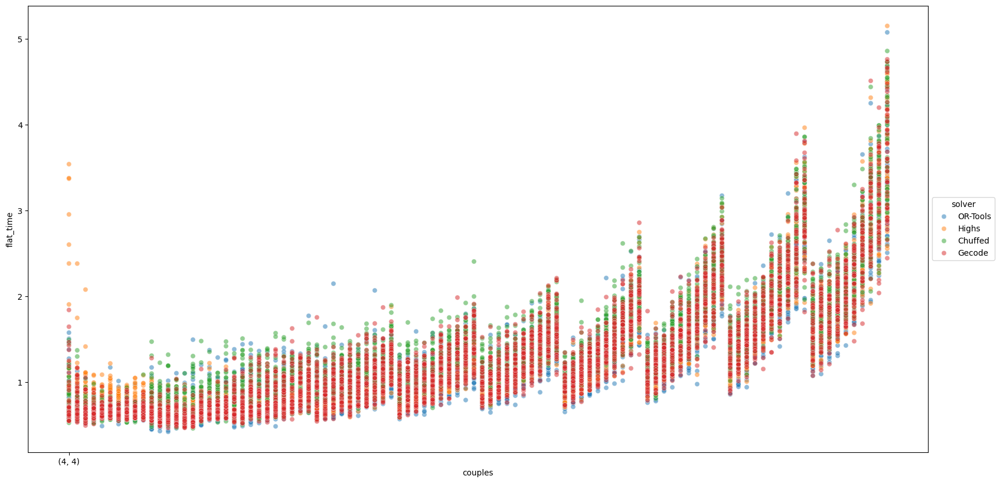

In [17]:
pair_df = df.sort_values(["components", "nodes"]).assign(**{
    "couples" : lambda df : df.apply(lambda x : (x["components"], x["nodes"]), axis=1)
})[["solver", "test", "couples", "flat_time"]]
pair_df["idx"] = pair_df.groupby("couples").ngroup()

show_every = 500
single_pairs = pair_df["couples"].drop_duplicates()
ticks = range(0, len(single_pairs.to_list()), show_every)
labels = single_pairs.apply(lambda x : str(x)).to_list()
labels = [labels[i] for i in ticks]

plt.figure(figsize=(20, 10))
p = sns.scatterplot(pair_df, x="idx", y="flat_time", alpha=0.5, hue="solver")
p.set_xticks(ticks)
p.set_xticklabels(labels)
p.set_xlabel("couples")
p.legend(title="solver", loc='center left', bbox_to_anchor=(1, 0.5))

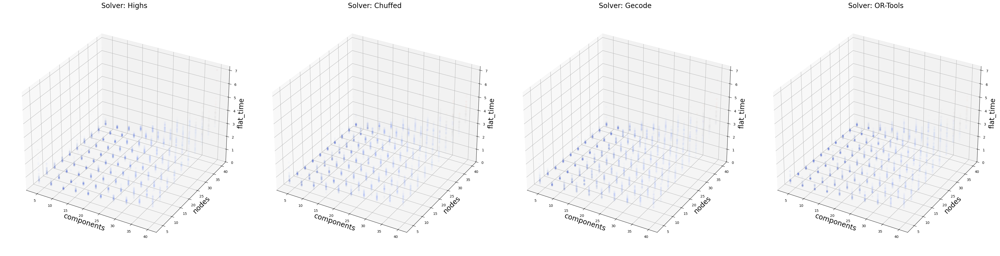

In [64]:
fig, axs = plt.subplots(
    nrows=1,
    ncols=len(solvers),
    figsize=(10 * len(solvers), 10),
    subplot_kw=dict(projection='3d')
)
axs_reshaped = axs.reshape(-1)
norm = Normalize(vmin=0, vmax=df.flat_time.max())
for solver, ax in zip(solvers, axs_reshaped):
    d = df.query("solver == @solver")
    ax.scatter(
        xs=d.components,
        ys=d.nodes,
        zs=d.flat_time,
        c=d.flat_time,
        cmap="coolwarm",
        norm=norm,
        alpha=1.0/(len(component_topologies) * len(infrastructure_topologies) * 3)
    )
    ax.set_xlabel("components", fontsize=20)
    ax.set_ylabel("nodes", fontsize=20)
    ax.set_zlabel("flat_time", fontsize=20)
    ax.set_title("Solver: " + solver, fontsize=20)
    ax.set_zlim([0, df.flat_time.max()])
    ax.set_box_aspect(None, zoom=0.95)

fig.tight_layout()

### Topologies

Text(0.5, 0.98, 'Flat time for different solvers and components topology')

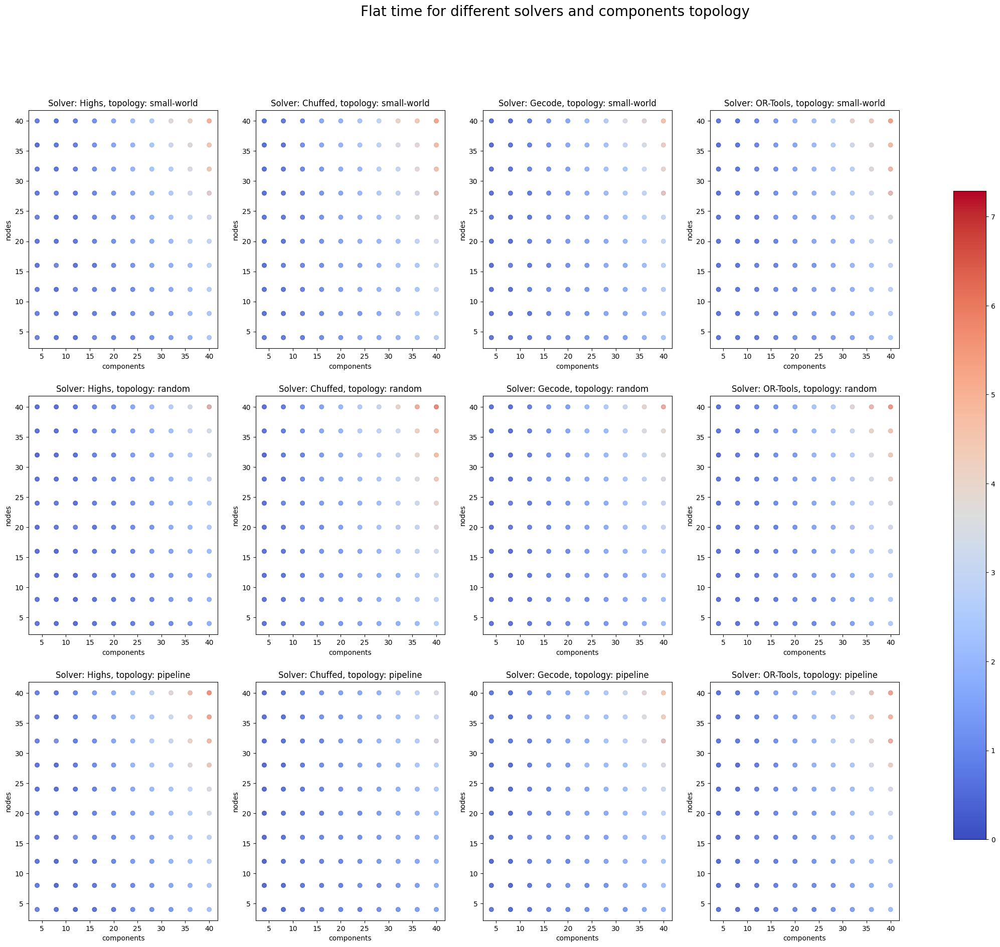

In [65]:
fig, axs = plt.subplots(
    nrows=len(component_topologies),
    ncols=len(solvers),
    figsize=(7 * len(solvers), 7 * len(component_topologies))
)
axs_reshaped = axs.reshape(-1)
axis = itertools.product(component_topologies, solvers)
for (topology, solver), ax in zip(axis, axs_reshaped):
    d = df.query("solver == @solver").query("comps_topology == @topology")
    ax.scatter(
        x=d.components,
        y=d.nodes,
        c=d.flat_time,
        cmap="coolwarm",
        alpha=1.0/(len(component_topologies) * 3)
    )
    ax.set_xlabel("components")
    ax.set_ylabel("nodes")
    ax.set_title("Solver: " + solver + ", topology: " + topology)

norm = Normalize(vmin=0, vmax=df.flat_time.max())
fig.colorbar(
    ScalarMappable(norm=norm, cmap="coolwarm"),
    ax=axs.ravel().tolist(),
    orientation='vertical',
    shrink=0.8
)
fig.suptitle("Flat time for different solvers and components topology", fontsize=20)

Text(0.5, 0.98, 'Solve time for different solvers and infrastructure topology')

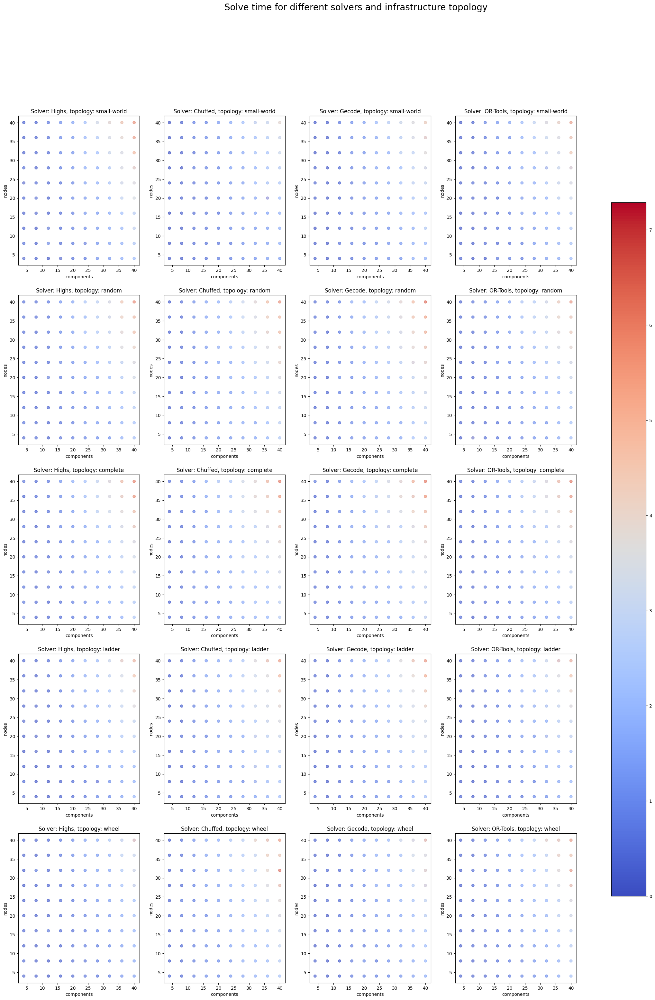

In [66]:
fig, axs = plt.subplots(
    nrows=len(infrastructure_topologies),
    ncols=len(solvers),
    figsize=(7 * len(solvers), 7 * len(infrastructure_topologies))
)
axs_reshaped = axs.reshape(-1)
axis = itertools.product(infrastructure_topologies, solvers)
for (topology, solver), ax in zip(axis, axs_reshaped):
    d = df.query("solver == @solver").query("infra_topology == @topology")
    ax.scatter(
        x=d.components,
        y=d.nodes,
        c=d.flat_time,
        cmap="coolwarm",
        alpha=1.0/(len(component_topologies) * 3)
    )
    ax.set_xlabel("components")
    ax.set_ylabel("nodes")
    ax.set_title("Solver: " + solver + ", topology: " + topology)

norm = Normalize(vmin=0, vmax=df.flat_time.max())
fig.colorbar(
    ScalarMappable(norm=norm, cmap="coolwarm"),
    ax=axs.ravel().tolist(),
    orientation='vertical',
    shrink=0.8
)
fig.suptitle("Solve time for different solvers and infrastructure topology", fontsize=20)

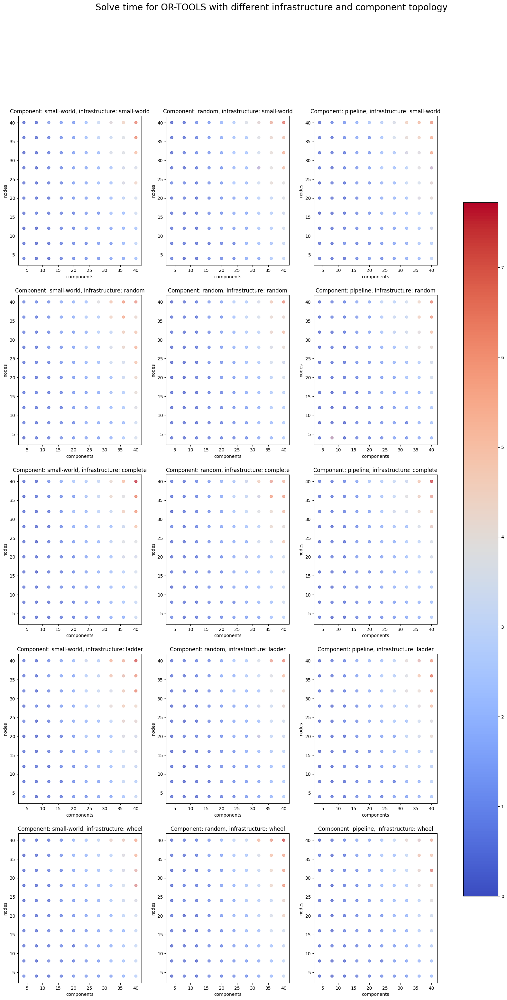

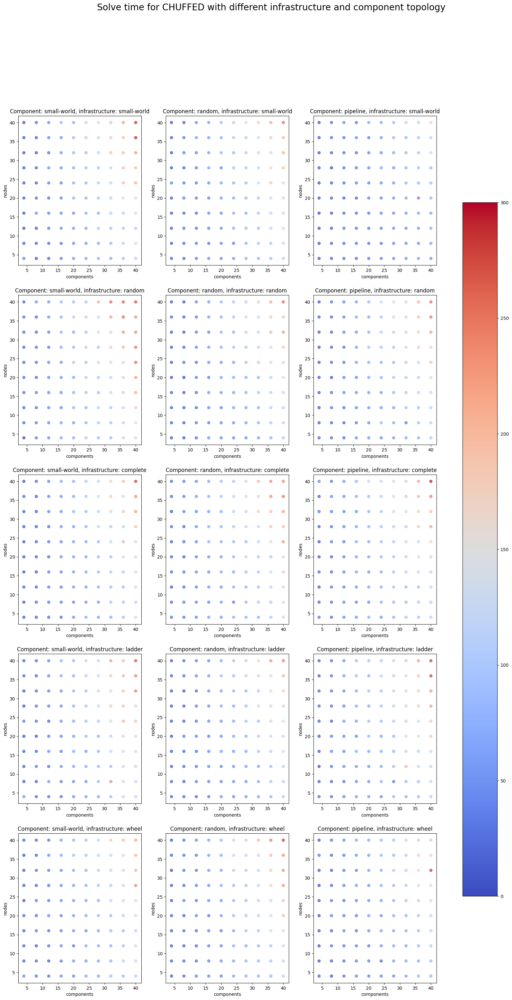

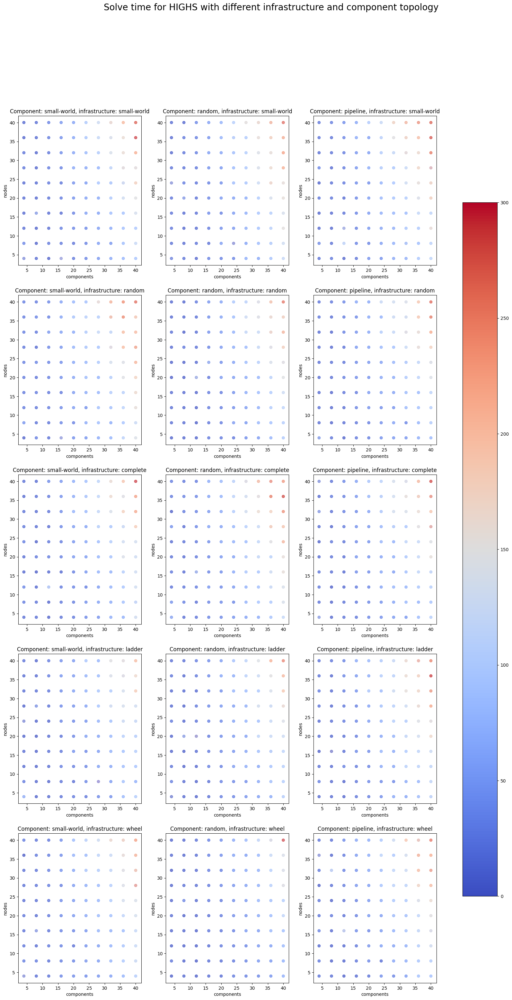

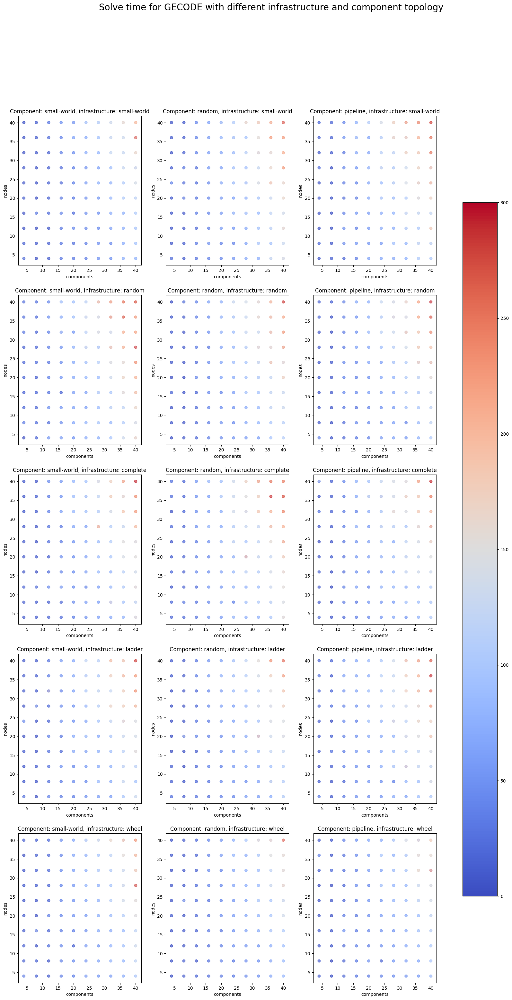

In [67]:
for solver in df.solver.unique():
    fig, axs = plt.subplots(
        nrows=len(infrastructure_topologies),
        ncols=len(component_topologies),
        figsize=(7 * len(component_topologies), 7 * len(infrastructure_topologies))
    )
    axs_reshaped = axs.reshape(-1)
    axis = itertools.product(infrastructure_topologies, component_topologies)
    df_solver = df.query("solver == @solver")
    for (infra_topology, comps_topology), ax in zip(axis, axs_reshaped):
        d = (
            df_solver
            .query("infra_topology == @infra_topology")
            .query("comps_topology == @comps_topology")
        )
        ax.scatter(
            x=d.components,
            y=d.nodes,
            c=d.flat_time,
            cmap="coolwarm",
            alpha=1.0/3
        )
        ax.set_xlabel("components")
        ax.set_ylabel("nodes")
        ax.set_title("Component: " + comps_topology + ", infrastructure: " + infra_topology)

    norm = Normalize(vmin=0, vmax=df_solver.solve_time.max())
    fig.colorbar(
        ScalarMappable(norm=norm, cmap="coolwarm"),
        ax=axs.ravel().tolist(),
        orientation='vertical',
        shrink=0.8
    )
    fig.suptitle("Solve time for " + solver.upper() + " with different infrastructure and component topology", fontsize=20)

# Flat time vs Solve time

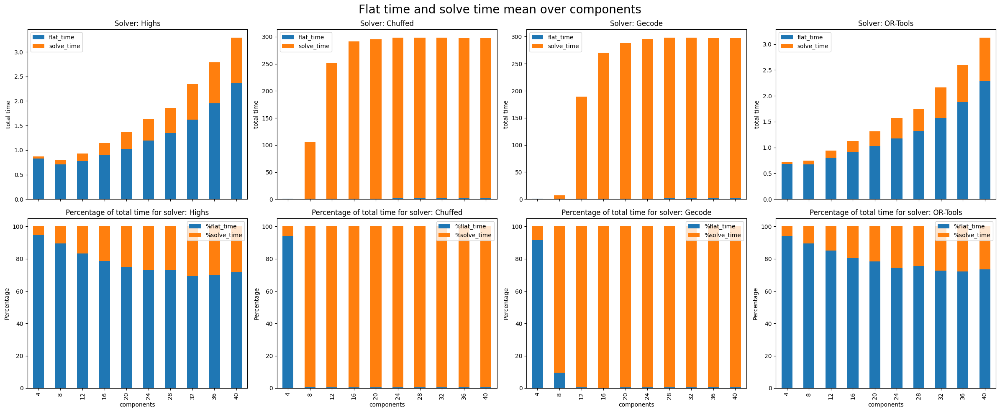

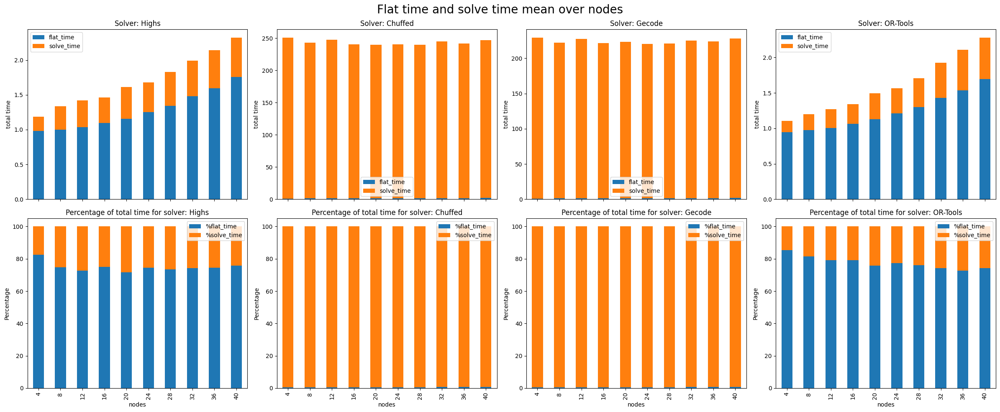

In [18]:
for over in ["components", "nodes"]:
    solver_number = len(solvers)
    fig, axs = plt.subplots(
        nrows=2,
        ncols=len(solvers),
        figsize=(6 * len(solvers), 10),
        sharex=True,
        #sharey="row"
    )
    axs_reshaped = axs.reshape(-1)

    mx = 0
    for solver, (i, ax) in zip(solvers, enumerate(axs_reshaped)):
        times = (
            df
            .query("solver == @solver")
            .assign(**{
                "solve_time" : lambda df : df["solve_time"] - df["flat_time"]
            })
            .groupby(over)
            [["flat_time", "solve_time"]]
            .mean()
        )

        times.plot.bar(
            ax=ax,
            stacked=True,
            title="Solver: " + solver
        )

        times.assign(**{
            "%flat_time" : lambda df : (df["flat_time"] / (df["flat_time"] + df["solve_time"])) * 100,
            "%solve_time" : lambda df : (df["solve_time"] / (df["flat_time"] + df["solve_time"])) * 100
        }).drop(
            columns=["solve_time", "flat_time"]
        ).plot.bar(
            stacked=True,
            title="Percentage of total time for solver: " + solver,
            ax=axs_reshaped[len(solvers) + i],
        )
        mx = max(mx, ax.get_ylim()[1])
        ax.set_ylabel("total time")
        axs_reshaped[len(solvers) + i].set_ylabel("Percentage")

    fig.suptitle("Flat time and solve time mean over " + over, fontsize=20)
    fig.tight_layout()
    plt.show()


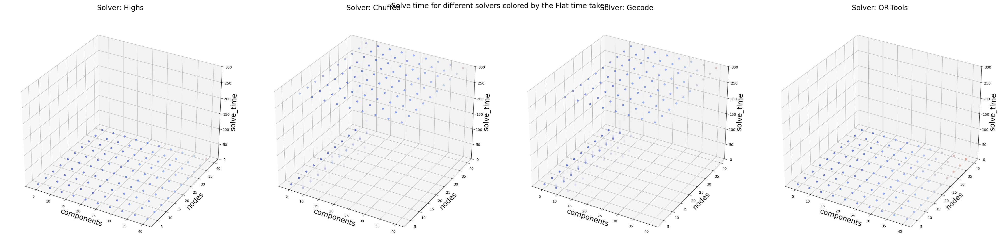

In [69]:
fig, axs = plt.subplots(
    nrows=1,
    ncols=len(solvers),
    figsize=(10 * len(solvers), 10),
    subplot_kw=dict(projection='3d')
)
axs_reshaped = axs.reshape(-1)
for solver, ax in zip(solvers, axs_reshaped):
    d = df.query("solver == @solver")
    ax.scatter(
        xs=d.components,
        ys=d.nodes,
        zs=d.solve_time,
        c=d.flat_time,
        cmap="coolwarm",
        alpha=1/(len(component_topologies) * len(infrastructure_topologies) * 3)
    )
    ax.set_xlabel("components", fontsize=20)
    ax.set_ylabel("nodes", fontsize=20)
    ax.set_zlabel("solve_time", fontsize=20)
    ax.set_title("Solver: " + solver, fontsize=20)
    ax.set_zlim([0, 300])
    ax.set_box_aspect(None, zoom=0.95)

fig.suptitle("Solve time for different solvers colored by the Flat time taken", fontsize=20)
fig.tight_layout()

# Paper images and tables

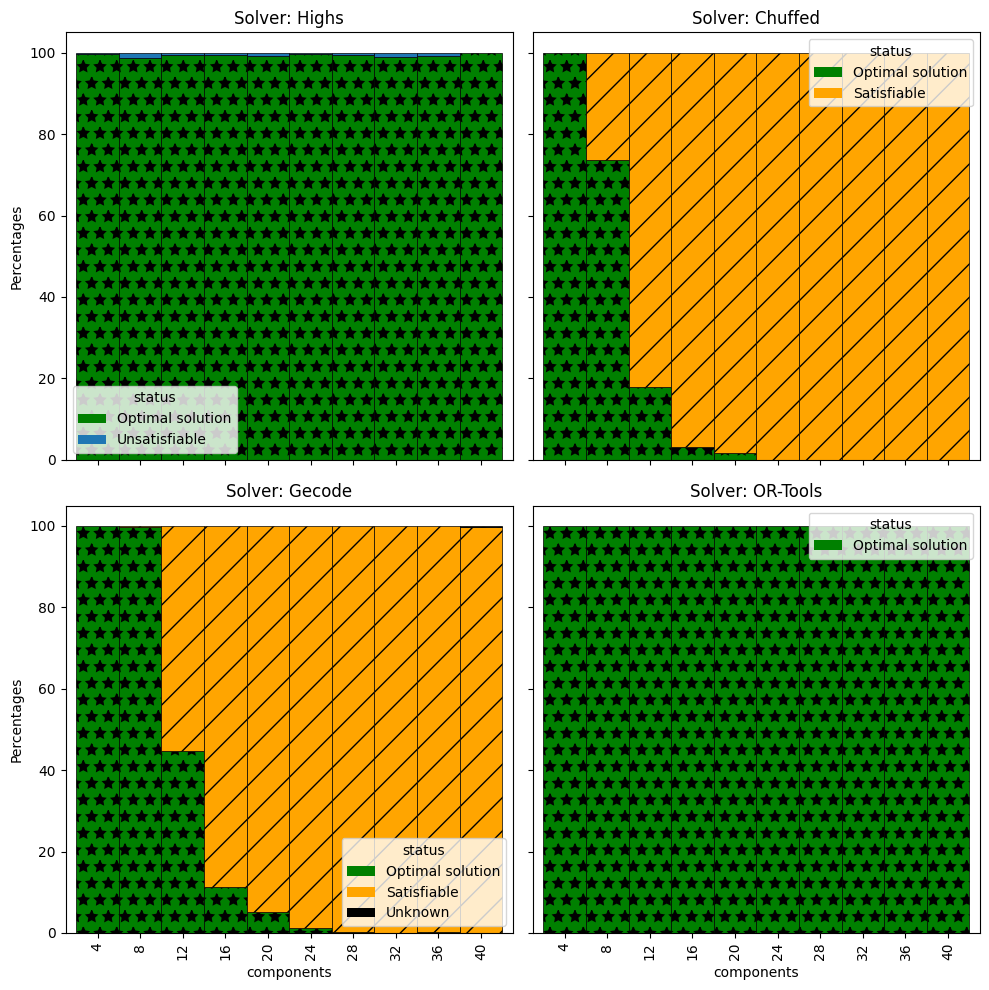

In [19]:
statuses = df.status.unique()
colors = {
    "Optimal solution": "green",
    "Unsatisfiable": "#1f77b4",
    "Unknown": "black",
    "Satisfiable" : "orange",
    "Error" : "red"
}

patterns = {
    "Optimal solution": "*",
    "Unsatisfiable": ".",
    "Unknown": "O",
    "Error": "+",
    "Satisfiable" : "/"
}

fig, axs = plt.subplots(
    nrows=int(len(solvers) / 2),
    ncols=int(len(solvers) / 2),
    sharex=True,
    sharey=True,
    figsize=(10, 10)
)
axs_reshaped = axs.reshape(-1)
norm = Normalize(vmin=0, vmax=100)
for solver, ax in zip(solvers, axs_reshaped):
    d = (
        df.query("solver == @solver")
        [["components", "status"]]
        .groupby("components")
        .value_counts(normalize=True)
        * 100
    ).reset_index().pivot(
        index="components",
        columns="status",
        values="proportion"
    ).fillna(0)

    d.plot.bar(
        color=colors,
        stacked=True,
        ax=ax,
        title="Solver: " + solver,
        width=1
    )
    ax.set_ylabel("Percentages")

    # Iterare sulle barre per aggiungere i pattern
    for column, bars in zip(d.columns, ax.containers):
        for bar in bars:
            bar.set_hatch(patterns[column])
            bar.set_edgecolor("black")
            bar.set_linewidth(.5)

fig.tight_layout()
plt.show()

In [20]:
mean_solve_time = (
    df[["solver", "solve_time"]]
    .groupby("solver")
    .aggregate("mean")
    .rename(columns={"solve_time" : "avg all"})
    .map(lambda x : str(round(x, 2)) + "s")
)
mean_solve_time

,avg all
solver,
Chuffed,243.58s
Gecode,224.19s
Highs,1.7s
OR-Tools,1.61s


In [21]:
mean_opt_solve_time = (
    df
    .query("status == 'Optimal solution' or status == 'Unsatisfiable'")
    [["solver", "solve_time"]]
    .groupby("solver")
    .aggregate("mean")
    .rename(columns={"solve_time" : "avg solved"})
    .map(lambda x : str(round(x, 2)) + "s")
)
mean_opt_solve_time

,avg solved
solver,
Chuffed,18.36s
Gecode,15.91s
Highs,1.7s
OR-Tools,1.61s


In [22]:
perc = (
    df[["solver", "status"]]
    .groupby("solver")
    .aggregate(lambda x : str(round((
        len(x[x.str.contains("Optimal solution") | x.str.contains("Unsatisfiable")]) / len(x)) * 100,
        2)) + "%")
    .rename(columns={"status" : "solved"})
)
perc

,solved
solver,
Chuffed,19.59%
Gecode,26.29%
Highs,100.0%
OR-Tools,100.0%


In [23]:
scores = []

for solver1, solver2 in itertools.combinations(solvers, r=2):
    to_group = df.query("solver == @solver1 or solver == @solver2")
    for _, group in to_group.groupby(["components", "nodes", "comps_topology", "infra_topology", "test"]):
        scores.append(group.assign(score=borda_count))

IndexError: single positional indexer is out-of-bounds

In [24]:
scores = (
    pd.concat(scores)
    [["solver", "score"]]
    .groupby("solver")
    .sum()
    .map(lambda x : round(x, 2))
    .sort_values("score", ascending=False)
)
scores

,score
solver,
Chuffed,152.33
Highs,111.67


In [25]:
min_max = (
    df
    [["solve_time", "solver"]]
    .groupby("solver")
    .aggregate(["min", "max"])
    .map(lambda x : str(round(x, 2)) + "s")
)
min_max.columns = min_max.columns.droplevel()
min_max

,min,max
solver,,
Chuffed,0.54s,299.71s
Gecode,0.52s,300.0s
Highs,0.56s,8.38s
OR-Tools,0.46s,11.82s


In [26]:
flat = (
    df[["flat_time", "solver"]]
    .groupby("solver")
    .aggregate("mean")
    .rename(columns={"flat_time" : "flat"})
    .map(lambda x : str(round(x, 2)) + "s")
)
flat

,flat
solver,
Chuffed,1.39s
Gecode,1.3s
Highs,1.27s
OR-Tools,1.23s


In [27]:
first_last = (
    df
    .query("status == 'Optimal solution' or status == 'Satisfiable'")
    [["objectives", "solver"]]
    .assign(**{
        "first" : lambda df : df.objectives.apply(lambda d : min(float(t) for t in d.keys())),
        "last" : lambda df : df.objectives.apply(lambda d : max(float(t) for t in d.keys()))
    }).drop(columns=["objectives"])
    .groupby("solver")
    .aggregate("mean")
    .map(lambda x : str(round(x, 2)) + "s")
)
first_last

,first,last
solver,,
Chuffed,1.46s,6.8s
Gecode,1.42s,33.46s
Highs,1.65s,1.69s
OR-Tools,1.5s,1.58s


In [28]:
table_errors = (
    pd.concat(errors)
    .drop(columns=["objectives"])
    .drop_duplicates()
    .reset_index()
    .assign(**{
        "error" : lambda df : df["index"].apply(lambda x : 1 if x in indexes_error else 0)
    }).groupby("solver")
    [["error"]]
    .sum()
    /
    len(df.groupby(["components", "nodes", "comps_topology", "infra_topology", "test"]))
    * 100
).map(lambda x : str(round(x, 2)) + "%")
table_errors

NameError: name 'errors' is not defined

In [29]:
table = (
    pd.concat([
        perc,
        table_errors,
        mean_solve_time,
        mean_opt_solve_time,
        min_max,
        first_last,
        flat,
        scores,
    ], axis=1)
    .sort_values("score", ascending=False)
    .assign(**{
        "score": lambda df : df["score"].apply(lambda x : round(x, 2))
    })
)

table.at["Highs", "avg all"] = "N/A"

#print(table.to_latex(multicolumn=False, escape=True, float_format="%.2f"))
table

NameError: name 'table_errors' is not defined

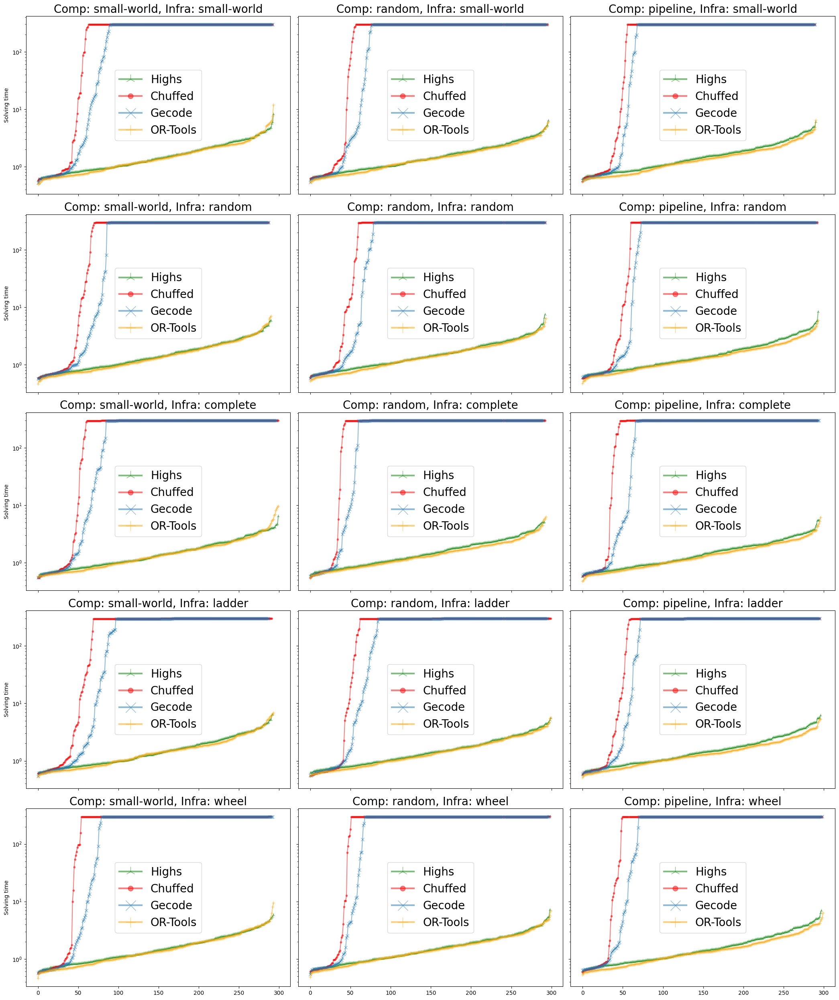

In [30]:
fig, axs = plt.subplots(
    ncols=len(component_topologies),
    nrows=len(infrastructure_topologies),
    sharex=True,
    sharey=True,
    figsize=(
        7 * len(component_topologies),
        5 * len(infrastructure_topologies)
    ),
)

for infra_topology, ax_row in zip(infrastructure_topologies, axs):
    for comps_topology, ax in zip(component_topologies, ax_row):
        for solver in solvers:
            a = (
                df
                .query("status != 'Error'")
                .query("comps_topology == @comps_topology")
                .query("infra_topology == @infra_topology")
                .query("solver == @solver")
                .solve_time
                .sort_values(ascending=True)
                .reset_index(drop=True).reset_index()
            )
            ax.plot(
                a.index,
                a.solve_time,
                marker=marker[solver],
                alpha=0.5,
                markersize=6,
                linestyle="-",
                color=color[solver],
                label=solver
            )

        ax.set_title("Comp: " + comps_topology + ", Infra: " + infra_topology, fontsize=20)
        ax.set_yscale('log')

        ax.legend(fontsize=20, markerscale=3)
        for legend_line in ax.get_legend().get_lines():
            legend_line.set_linewidth(3)

for ax_row in axs:
    ax_row[0].set_ylabel("Solving time")

fig.tight_layout()

In [59]:
save_fig(fig, "solve-time-top-scal")

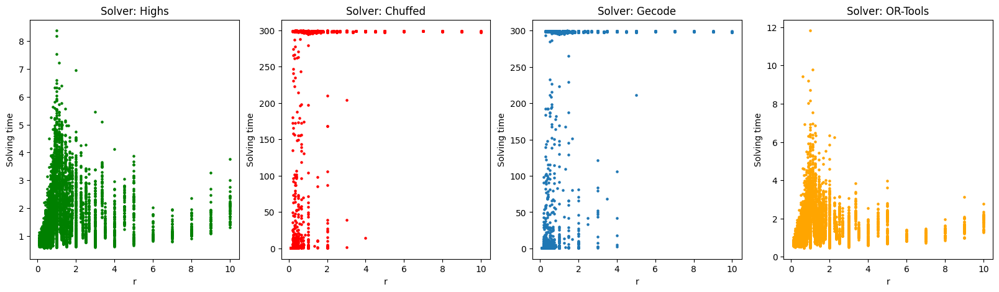

In [31]:
fig, axs = plt.subplots(
    nrows=1,
    ncols=len(solvers),
    #sharex=True,
    #sharey=True,
    figsize=(
        5 * len(solvers),
        5
    ),
)

for s, ax in zip(solvers, axs):
    (
        df
        .query("solver == @s")
        .query("status != 'Error'")
        .assign(**{"#comps/#nodes" : lambda df: df.components/df.nodes})
        [["#comps/#nodes", "solve_time"]]
        #.groupby("#comps/#nodes")
        #.mean()
        .sort_values("solve_time")
    ).plot.scatter(
        x="#comps/#nodes",
        y="solve_time",
        marker='.',
        #linestyle="-",
        color=color[s],
        ax=ax,
    )
    ax.set_title("Solver: " + s)
    ax.set_xlabel("r")
    ax.set_ylabel("Solving time")

In [61]:
save_fig(fig, "comp_nodes")

In [62]:
# import networkx as nx

# amount = 10

# graphs = {
#     "small-world": nx.barabasi_albert_graph(amount, 3 * int(amount / 4)),
#     "random": nx.erdos_renyi_graph(amount, p=0.5),
#     "ladder": nx.ladder_graph(amount // 2),
#     "wheel": nx.wheel_graph(amount),
#     "pipeline": nx.path_graph(amount),
#     "complete": nx.complete_graph(amount),
# }

# nx.write_latex(
#     [g for g in graphs.values()],
#     "./graphs/topologies.tex",
#     **{
#         "sub_captions" : [k.capitalize() + " topology" for k in graphs.keys()],
#         "sub_labels" : [k for k in graphs.keys()],
#         "n_rows" : 3.1,
#         "latex_label" : "fig:topologies",
#         "as_document" : False,
#         "caption": "Examples of topologies."
#     }
# )

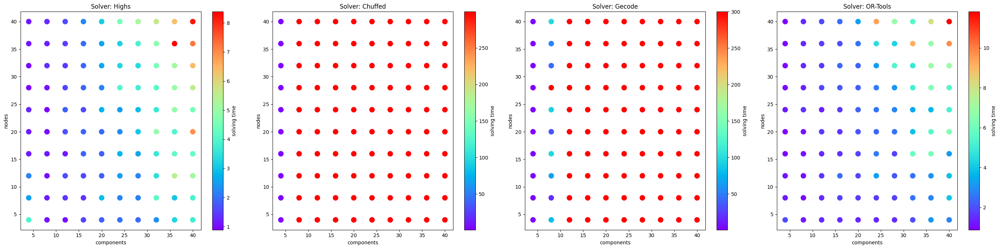

In [32]:
fig, axs = plt.subplots(
    nrows=1,
    ncols=len(solvers),
    figsize=(7 * len(solvers), 7)
)
axs_reshaped = axs.reshape(-1)
for solver, ax in zip(solvers, axs_reshaped):
    d = (
        df.query("solver == @solver")
        .query("status != 'Error'")
        [["components", "nodes", "solve_time"]]
        .groupby(["components", "nodes"])
        .max()
        .reset_index()
    )

    d.plot.scatter(
        x="components",
        y="nodes",
        c="solve_time",
        cmap="rainbow",
        s=100,
        ax=ax
    )

    errors = df.query("solver == @solver").query("status == 'Error'")
    errors.plot.scatter(
        x="components",
        y="nodes",
        c="white",
        s=100,
        ax=ax,
        legend=False
    )
    errors.plot.scatter(
        x="components",
        y="nodes",
        c="black",
        ax=ax,
        marker="x",
        s=100,
        legend=False
    )

    ax.collections[0].colorbar.set_label("solving time")
    ax.collections[0].colorbar
    ax.set_title("Solver: " + solver)

fig.tight_layout()

In [33]:
def choose_leader(s):
    if any(x in s.status for x in ["Optimal solution", "Satisfiable"]):
        return "SAT"
    else:
        return "UNSAT"

(
    df.groupby(["components", "nodes", "comps_topology", "infra_topology", "test"])
    .aggregate({"status": set})
    .reset_index()
    .apply(choose_leader, axis=1)
    .value_counts()
    /
    len(df.groupby(["components", "nodes", "comps_topology", "infra_topology", "test"]))
    *
    100
).map(lambda x : str(round(x, 2)) + "%")#.reset_index()

SAT    100.0%
Name: count, dtype: object

In [34]:
df.query("status == 'Error'")

,status,flat_time,solve_time,objectives,solver,components,flavours,nodes,resources,comps_topology,infra_topology,test,optimal_solution


In [96]:
len(combinations)

18000